<font size="7"><center>Flight Fare Prediction</center></font>


<font size="6"><center> **Modeling and Analysis**</center></font>

---

<div class="alert alert-warning">
    
<font size="2">__Author__: -  Kasun Malwenna</font>

<font size="2">__Contact__: - kasunmalwenna@gmail.com</font>
    
---
    
This notebook only consists of modelling and evaluating supervised ML models using the cleaned version of the data. 
    
For cleaning and preprocessing steps, refer to **"_Data_Wrangling_and_EDA__Kasun_Malwenna.ipynb_"** notebook and for Neural Network model, refer to **"_Neural_Network_Flight_Fare_Kasun_Malwenna.ipynb_"** notebook.
    
---  
</div>

># Table of Contents


&#10148; [Modeling Approach](#part1)</br>


&#10148; [Evaluation Metrics](#part2)</br>


&#10148; [Importing Data](#part3)</br>


&#10148; [Pre-Modeling Stage](#part4)</br>


&#10148; [Linear Reagression](#part5)</br>


&#10148; [K-nearest Neighbours Regression](#part6)</br>


&#10148; [Random Forest Regression](#part7)</br>


&#10148; [Histogram-based Gradient Boosting Regression](#part8)</br>


&#10148; [Models Summary](#part9)</br>


&#10148; [Best Model and Predictions](#part10)</br>

># Modeling Approach<a class='anchor' id='part1'></a>

The general process we will follow for modeling is:
1. Load the data
2. Fit the model
3. Make predictions and evaluate the model

In a machine learning context: 
* Dependent variable = target = $y$
* Independent variables = features = $X$

We will create and train several supervised machine learning models and a deep learning model and compare the evaluation metrics using a custom function and pick the best-performing model to predict the ticket price.


Models to be trained:

1. Linear Regression 
       Attempts to model the relationship between features and target by fitting a linear equation and predicting new values of our target variables.
2. K-nearest Neighbors Regression
       KNN uses the notion of similarity and distance to predict the numerical target by averaging the observations in the same neighbourhood.
3. Random Forest Regression
       It is an ensemble learning method which fits several classifying decision trees on various sub-samples of the              dataset and combines predictions to make a more accurate prediction than a single model. 

4. Histogram-Based Gradient Boosting Regression
       It is a gradient-boosting algorithm which takes a collection of decision trees as the base estimators and trains            each estimator on the errors of the previous ones to make a more accurate prediction. Although like XGBoost, this              employs a technique of binning the continuous input variables to a few hundred unique values, thus making it faster on large datasets.

5. Deep Neural Network
       A set of algorithms strung together, modeled loosely after the human brain by interconnected nodes in a layered            structure, that are designed to recognize patterns.


---
># Evaluation Metrics<a class='anchor' id='part2'></a>

Although we can call upon built-in evaluation methods for the models, it will be intuitive and efficient to create a function that uses several different metrics to compare the models. 

We will be assessing the model performance using the following metrics;

- __R-Squared Score__  - the coefficient of determination which is the proportion of the variance in the dependent variable that is predictable from all the independent variables. 

$\uparrow$$Higher$ $\rightarrow$ $Better$

- __Adjusted R-Squared Score__ - measures the proportion of variation explained by only those independent variables that really help in explaining the dependent variable. 

$\uparrow$$Higher$ $\rightarrow$ $Better$

- __Mean Absolute Error (MAE)__ - the average error value in a set of predicted values without considering direction. 

$\downarrow$$Lower$ $\rightarrow$ $Better$

- __Root Mean Squared Error (RMSE)__ - the square root of the average squared error value in a set of predicted values. 

$\downarrow$$Lower$ $\rightarrow$ $Better$

- __Mean Absolute Percentage Error (MAPE)__ - the average error in a set of predicted values without considering direction as a percentage. Can be more than 100%. 

$\downarrow$$Lower$ $\rightarrow$ $Better$


First, we will import the packages needed for the analysis and create a custom evaluation function.

In [39]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.gridspec as gridspec
import plotly
import cufflinks as cf
from cufflinks.offline import go_offline
import plotly.express as px
import plotly.io as pio
from plotly.offline import download_plotlyjs,init_notebook_mode,plot,iplot
init_notebook_mode(connected=True)
cf.go_offline()

import random
np.random.seed(123)
random.seed(123)

from scipy import stats

from sklearn.model_selection import train_test_split

# Import the scaler
from sklearn.preprocessing import StandardScaler, MinMaxScaler

from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression
from sklearn.linear_model import LinearRegression
from sklearn import metrics

from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.experimental import enable_hist_gradient_boosting
from sklearn.ensemble import HistGradientBoostingRegressor
from sklearn.pipeline import Pipeline
from tempfile import mkdtemp

from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import RandomizedSearchCV

import joblib

import warnings
warnings.filterwarnings('ignore')
# import warnings
# warnings.simplefilter(action='ignore', category=FutureWarning)
# warnings.simplefilter(action='ignore', category=UserWarning)

In [2]:
# Difining a function to evaluate the models

def evaluate(model, X_test, y_test, X_train, y_train):
    
    # Empty list to record metrics
    performance_metrics = []
    
    # ake predictions
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    
    # Append model name
    performance_metrics.append(model)
    
    print('Model Performance')
    print('-----------------')
    
    from sklearn import metrics
    
    # coefficient of determination
    train_r2 = round(metrics.r2_score(y_train,y_pred_train),4)
    print(f"Train set R2 score: {train_r2}")
    test_r2 = round(metrics.r2_score(y_test,y_pred_test),4)
    performance_metrics.append(test_r2)
    print(f"Test R2 score: {test_r2}")
    
    # Adjusted r2
    # Define variables to calculate adjusted r2 score
    r2 = metrics.r2_score(y_test,y_pred_test) #The R2 of the model
    n = len(y_test)                      #The number of observations
    k = X_test.shape[1]                  #The number of predictor variables
    
    # calculate adjusted r2 score
    adj_r2_score = round(1-(((1-r2)*(n-1))/(n-k-1)),4)
    performance_metrics.append(adj_r2_score)
    print(f"Test set Adjusted R2 score: {adj_r2_score}")
    
    # Root Mean Squared Error
    RMSE = round(metrics.mean_squared_error(y_test,y_pred_test, squared=False),4)
    performance_metrics.append(RMSE)
    print(f"Test set Root Mean Squared Error - RMSE: {RMSE}")
    
    # Mean Absolute Error
    MAE = round(metrics.mean_absolute_error(y_test,y_pred_test),4)
    performance_metrics.append(MAE)
    print(f"Test set Mean Absolute Error - MAE: {MAE}")
    
    # Mean Absolute Precentage Error
    MAPE = round(metrics.mean_absolute_percentage_error(y_test, y_pred_test),4)
    performance_metrics.append(MAPE)
    print(f"Test set Mean Absolute Precentage Error - MAPE: {MAPE}")
    
    return performance_metrics

---
># Importing Data<a class='anchor' id='part3'></a>

In [3]:
# Load and save the cleaned data to a dataframe
data_df = pd.read_csv('Data/Cleaned_flight_fare.csv')
data_df.head()


,airline,stop,price,trip_month,trip_day,dep_time_hour,dep_time_minute,arr_time_hour,arr_time_minute,duration_hours,...,Origin_Delhi,Origin_Hyderabad,Origin_Kolkata,Origin_Mumbai,Destination_Bangalore,Destination_Chennai,Destination_Delhi,Destination_Hyderabad,Destination_Kolkata,Destination_Mumbai
0,5,0,5953.0,11,2,18,55,21,5,2,...,1,0,0,0,0,0,0,0,0,1
1,5,0,5953.0,11,2,6,20,8,40,2,...,1,0,0,0,0,0,0,0,0,1
2,1,0,5956.0,11,2,4,25,6,35,2,...,1,0,0,0,0,0,0,0,0,1
3,7,0,5955.0,11,2,10,20,12,35,2,...,1,0,0,0,0,0,0,0,0,1
4,7,0,5955.0,11,2,8,50,11,10,2,...,1,0,0,0,0,0,0,0,0,1


In [4]:
# Dataset summary
print(f"Rows in the dataframe: {data_df.shape[0]}")
print(f"Columns in the dataframe: {data_df.shape[1]}")

Rows in the dataframe: 300259
Columns in the dataframe: 23


In [5]:
# Observe the data types
data_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300259 entries, 0 to 300258
Data columns (total 23 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   airline                300259 non-null  int64  
 1   stop                   300259 non-null  int64  
 2   price                  300259 non-null  float64
 3   trip_month             300259 non-null  int64  
 4   trip_day               300259 non-null  int64  
 5   dep_time_hour          300259 non-null  int64  
 6   dep_time_minute        300259 non-null  int64  
 7   arr_time_hour          300259 non-null  int64  
 8   arr_time_minute        300259 non-null  int64  
 9   duration_hours         300259 non-null  int64  
 10  duration_minutes       300259 non-null  int64  
 11  Origin_Bangalore       300259 non-null  int64  
 12  Origin_Chennai         300259 non-null  int64  
 13  Origin_Delhi           300259 non-null  int64  
 14  Origin_Hyderabad       300259 non-nu

Our columns are in __int64__ and __float64__ formats, which take up more memory and can cause memory allocation errors during the fitting stages. Lets covert them to __int32__ and __float64__ to avoid this.

In [6]:
# Returns dictionary with the specified keys and the specified value
dtype_to_int_32 = dict.fromkeys(data_df.select_dtypes(np.int64).columns, np.int32)

# Change the datatypes of integer columns
data_df = data_df.astype(dtype_to_int_32)

# Change the datatype of float columns
data_df['price'] = data_df['price'].astype('float32')

In [7]:
# Check
data_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300259 entries, 0 to 300258
Data columns (total 23 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   airline                300259 non-null  int32  
 1   stop                   300259 non-null  int32  
 2   price                  300259 non-null  float32
 3   trip_month             300259 non-null  int32  
 4   trip_day               300259 non-null  int32  
 5   dep_time_hour          300259 non-null  int32  
 6   dep_time_minute        300259 non-null  int32  
 7   arr_time_hour          300259 non-null  int32  
 8   arr_time_minute        300259 non-null  int32  
 9   duration_hours         300259 non-null  int32  
 10  duration_minutes       300259 non-null  int32  
 11  Origin_Bangalore       300259 non-null  int32  
 12  Origin_Chennai         300259 non-null  int32  
 13  Origin_Delhi           300259 non-null  int32  
 14  Origin_Hyderabad       300259 non-nu

---

># Pre-Modeling Stage<a class='anchor' id='part4'></a>

Now, we will define the dependent and independent variables and check for multicollinearity using a correlation heatmap because multicollinearity can weaken the statistical power of our regression models.

In [8]:
# Defining the dependent and independent variables 

X = data_df.drop(columns= ["price"]) # independent
y = data_df["price"]                 # dependent

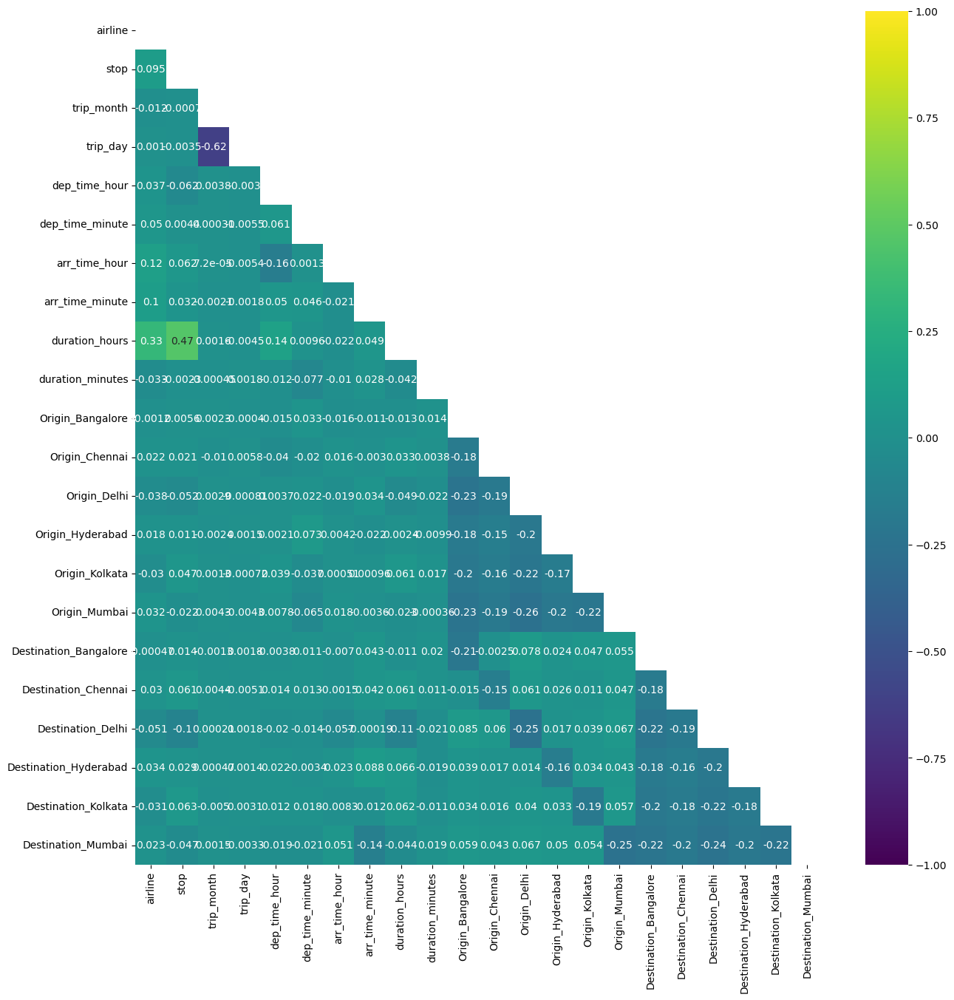

In [9]:
# Check for multicollinearity 
corr = X.corr()
mask = np.triu(corr)

plt.figure(figsize=(15,15))
sns.heatmap(corr, annot = True, vmax=1, vmin=-1, center=0, cmap='viridis', mask=mask)
plt.show()

Multicollinearity is preset when two independent variables share a correlation coefficient $\le$ $0.7$. Our strongest correlation is $0.62$ and, therefore, no multicollinearity.

### Spliting the Dataset

We will split our dataset into training and test and train the model on training and evaluate the performance on both training and test sets. The reason for the split is to obtain an unbiased estimate of the model's performance by ensuring models do not overfit to the data they are trained on and can generalize well to new data.

Let’s split our dataset so that training will have 80% of the observations and the test set will have 20%.

In [10]:
# Split the data so the test set contains 20% of the points
# random state is setting the seed for the random split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=123)

# Check shapes 
print(f' Train set shape: {X_train.shape}')
print(f' Test set shape: {X_test.shape}')

 Train set shape: (240207, 22)
 Test set shape: (60052, 22)


To be able to access them later on, we can save the two sets by adding them to dataframes with their corresponding target variable values and export as $.csv$ files.

In [11]:
# Create train dataframe
train_df = pd.DataFrame(X_train)
# Add target column
train_df['price'] = y_train
# Check
train_df.head()

,airline,stop,trip_month,trip_day,dep_time_hour,dep_time_minute,arr_time_hour,arr_time_minute,duration_hours,duration_minutes,...,Origin_Hyderabad,Origin_Kolkata,Origin_Mumbai,Destination_Bangalore,Destination_Chennai,Destination_Delhi,Destination_Hyderabad,Destination_Kolkata,Destination_Mumbai,price
47824,4,0,8,3,8,0,10,10,2,10,...,0,0,1,0,0,1,0,0,0,2748.0
195410,7,2,3,3,10,45,19,15,8,30,...,0,0,0,1,0,0,0,0,0,6432.0
84389,3,1,2,13,14,45,19,55,5,10,...,0,0,0,0,0,1,0,0,0,12581.0
284175,9,1,7,3,12,55,19,55,7,0,...,1,0,0,0,0,0,0,1,0,48851.0
194026,7,1,2,13,9,45,8,50,23,5,...,0,0,0,1,0,0,0,0,0,14021.0


In [12]:
# Create train dataframe
test_df = pd.DataFrame(X_test)
# Add target column
test_df['price'] = y_test
# Check
test_df.head()

,airline,stop,trip_month,trip_day,dep_time_hour,dep_time_minute,arr_time_hour,arr_time_minute,duration_hours,duration_minutes,...,Origin_Hyderabad,Origin_Kolkata,Origin_Mumbai,Destination_Bangalore,Destination_Chennai,Destination_Delhi,Destination_Hyderabad,Destination_Kolkata,Destination_Mumbai,price
215622,8,0,3,27,21,15,23,55,2,40,...,0,0,0,1,0,0,0,0,0,32859.0
260383,8,1,12,3,21,0,12,40,15,40,...,0,0,0,0,1,0,0,0,0,60396.0
91425,3,0,3,19,16,30,19,20,2,50,...,0,0,0,0,0,1,0,0,0,4500.0
9044,6,1,3,27,20,40,17,5,20,25,...,0,0,0,0,0,0,0,0,1,3855.0
229606,9,1,3,27,16,5,16,30,24,25,...,0,0,1,0,0,1,0,0,0,36565.0


Exporting train and test data sets after the split.

In [13]:
train_df.to_csv('train_data.csv',index=False)
test_df.to_csv('test_data.csv',index=False)

In [14]:
# Defining the dependent and independent variables for train and test sets

X_train = train_df.drop(columns= ["price"]) # independent
y_train = train_df["price"]                 # dependent

X_test = test_df.drop(columns= ["price"]) # independent
y_test = test_df["price"]                 # dependent

### Scaling Data

Our dataset contains many categorical features encoded to binary values, and scaling these would not make sense. In such cases scaling should be avoided. However, our dataset also contains several numerical features on different scales. When certain ML models are used with unscaled data, meaningful distances in low-scale features can overshadow unimportant distances in higher-scale features. So, scaling the data allows distances within each feature to be noticed. Therefore, we would have to scale the entire dataset before fitting distance base classifiers.

Some machine learning models like __Logistic Regression__ and __KNN__ are sensitive to data scale, and some tree based models Like __Decision Tree__ and __Random Forest__ are not sensitive. Therefore, scaling data appropriately according to the model is an integral part of developing a better model.

Let’s standardize the data using `StandardScaler` first as its the widely used scaling method and use that for feature selection.

In [15]:
# Scale data using StandardScaler

# Instantiate and fit the scaler
ss = StandardScaler()
ss.fit(X_train)

# Transform the data
X_train_ss = ss.transform(X_train)
X_test_ss = ss.transform(X_test)

### Feature Selection

To avoid the risk of overfitting and to maximize the predictive power of the model, let’s perform a univariate feature selection using `SelectKBest.` This removes all but a pre-specified number of highest-scoring features. Alternatively, we can use this on all the features and observe the evaluation metrics to determine which features to keep.

In [16]:
%%time 

# Empty lists to record the metrics
r2_train_scores = []
r2_test_scores = []

RMSE_train = []
RMSE_test = []

MAE_train = []
MAE_test = []

# range of k values
ks = list(range(1, X_train_ss.shape[1]+1))


# For loop to iterate ove k values
for k in ks:
    
    # Instantiate KBest feature selector and fit
    my_KBest = SelectKBest(f_regression, k=k).fit(X_train_ss, y_train)
    
    # Transform the selected
    X_train_selected = my_KBest.transform(X_train_ss)
    X_test_selected = my_KBest.transform(X_test_ss)
    
    # Instantiate Linear regression and fit pn selected train
    model = LinearRegression(normalize=False)
    model.fit(X_train_selected, y_train)
    
    # Make prediction
    y_pred_train = model.predict(X_train_selected)
    y_pred_test = model.predict(X_test_selected)

    # Print the selected features
    print(f"k = {k}, \nBest features: {np.array(X.columns)[my_KBest.get_support()]}\n")

    # Score and appened the metrics
    r2_train_scores.append(model.score(X_train_selected, y_train))
    r2_test_scores.append(model.score(X_test_selected, y_test))
    
    RMSE_train.append(metrics.mean_squared_error(y_train, y_pred_train, squared=False))
    RMSE_test.append(metrics.mean_squared_error(y_test, y_pred_test, squared=False))
    
    MAE_train.append(metrics.mean_absolute_error(y_train,y_pred_train))
    MAE_test.append(metrics.mean_absolute_error(y_test,y_pred_test))


k = 1, 
Best features: ['airline']

k = 2, 
Best features: ['airline' 'duration_hours']

k = 3, 
Best features: ['airline' 'stop' 'duration_hours']

k = 4, 
Best features: ['airline' 'stop' 'arr_time_hour' 'duration_hours']

k = 5, 
Best features: ['airline' 'stop' 'arr_time_hour' 'duration_hours' 'Destination_Delhi']

k = 6, 
Best features: ['airline' 'stop' 'arr_time_hour' 'arr_time_minute' 'duration_hours'
 'Destination_Delhi']

k = 7, 
Best features: ['airline' 'stop' 'arr_time_hour' 'arr_time_minute' 'duration_hours'
 'Origin_Delhi' 'Destination_Delhi']

k = 8, 
Best features: ['airline' 'stop' 'dep_time_hour' 'arr_time_hour' 'arr_time_minute'
 'duration_hours' 'Origin_Delhi' 'Destination_Delhi']

k = 9, 
Best features: ['airline' 'stop' 'dep_time_hour' 'dep_time_minute' 'arr_time_hour'
 'arr_time_minute' 'duration_hours' 'Origin_Delhi' 'Destination_Delhi']

k = 10, 
Best features: ['airline' 'stop' 'dep_time_hour' 'dep_time_minute' 'arr_time_hour'
 'arr_time_minute' 'duration_hou

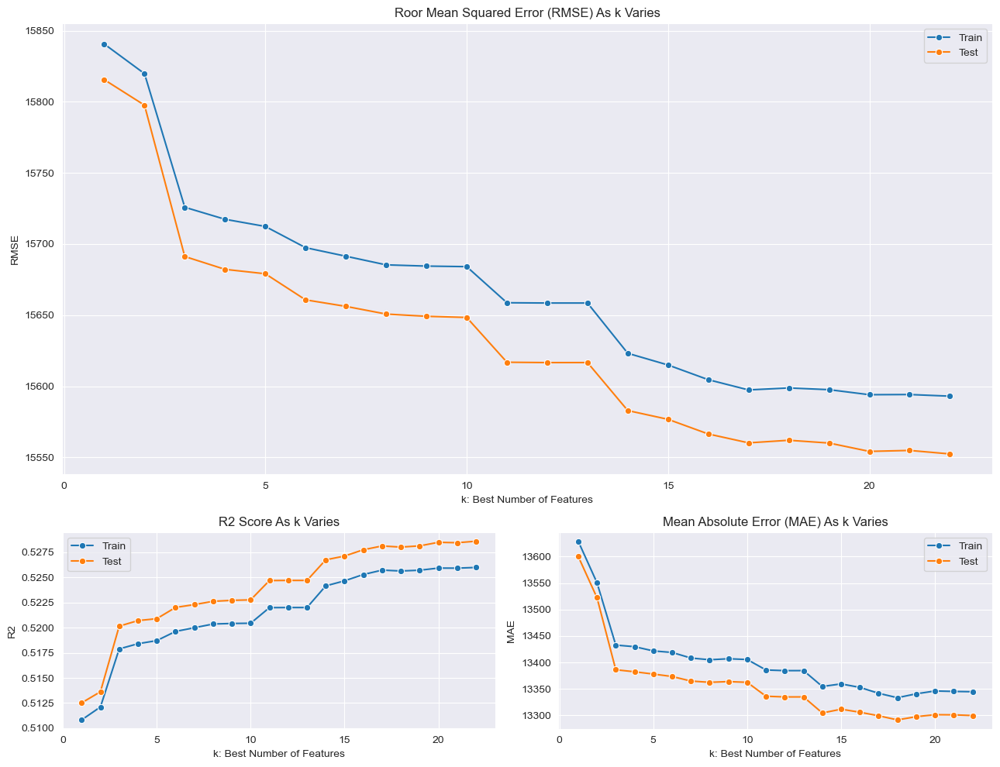

In [17]:
# Visualize results
# Set up grid of subplots
gridspec.GridSpec(3,2)

# create a figure
fig = plt.figure()

# set size of subplot's
fig.set_figheight(10)
fig.set_figwidth(13)

sns.set_style('darkgrid') # set grid style

# define first subplot location
plt.subplot2grid((3,2), (0,0), colspan=2, rowspan=2) 

sns.lineplot(x = ks, y = RMSE_train, legend='brief', label='Train', marker="o")
sns.lineplot(x = ks, y = RMSE_test, legend='brief', label='Test', marker="o")
plt.xlabel("k: Best Number of Features")
plt.ylabel("RMSE")
plt.title("Roor Mean Squared Error (RMSE) As k Varies")


# define next subplot location
plt.subplot2grid((3,2), (2,0))

sns.lineplot(x = ks, y = r2_train_scores, legend='brief', label='Train', marker="o")
sns.lineplot(x = ks, y = r2_test_scores, legend='brief', label='Test', marker="o")
plt.xlabel("k: Best Number of Features")
plt.ylabel("R2")
plt.title("R2 Score As k Varies")


# define last subplot location
plt.subplot2grid((3,2), (2,1))  

sns.lineplot(x = ks, y = MAE_train, legend='brief', label='Train', marker="o")
sns.lineplot(x = ks, y = MAE_test, legend='brief', label='Test', marker="o")
plt.xlabel("k: Best Number of Features")
plt.ylabel("MAE")
plt.title("Mean Absolute Error (MAE) As k Varies")

plt.tight_layout()

plt.show()

<div class="alert alert-info">
    
### Observation
    
R2 score kept improving while error scores kept decreasing for all the features. Therefore, all features can be useful in predicting the target accurately.


---



># Linear Reagression<a class='anchor' id='part5'></a>

Linear regression fits the normalized model by default. Since we are the regressor is sensitive to scale, and we are using standardization to scale, we must fit the model with 'normalize=False.’

In [18]:
%%time
# 1. Instantiate the model
LR_model = LinearRegression(normalize=False)

# 2. Fit the model
LR_model.fit(X_train_ss, y_train)


CPU times: total: 516 ms
Wall time: 128 ms


LinearRegression()

In [19]:
# 3. Evaluate the model using custiom function
LR_model_performance = evaluate(LR_model, X_test_ss, y_test, X_train_ss, y_train)

Model Performance
-----------------
Train set R2 score: 0.526
Test R2 score: 0.5286
Test set Adjusted R2 score: 0.5284
Test set Root Mean Squared Error - RMSE: 15552.4321
Test set Mean Absolute Error - MAE: 13299.8418
Test set Mean Absolute Precentage Error - MAPE: 1.7199


That is poor performance scores. Let’s see if we get improved scores using normalized data.

In [20]:
%%time
# Normalized model
# 1. Instantiate the model
LR_model_ms = LinearRegression(normalize=True)

# 2. Fit the model
LR_model_ms.fit(X_train, y_train)

# 3. Evaluate the model using custiom function
LR_model_ms_performance = evaluate(LR_model_ms, X_test, y_test, X_train, y_train)

Model Performance
-----------------
Train set R2 score: 0.5256
Test R2 score: 0.5283
Test set Adjusted R2 score: 0.5282
Test set Root Mean Squared Error - RMSE: 15557.0305
Test set Mean Absolute Error - MAE: 13331.163
Test set Mean Absolute Precentage Error - MAPE: 1.7459
CPU times: total: 625 ms
Wall time: 162 ms


We observe no improvement.

<div class="alert alert-info">
    
### Conclusion
For both satndarized and normalized models:
- There is no large discrepancy between Train and Test R2 scores; therefore, the model is not overfitting to training data.
- R2 score $\approx$ adjusted R2 score indicates all the variables are useful for predicting the target as we have already determined at feature selection. 
- Error scores are very high, while R2 scores are low, Therefore __Linear Regression model performs poorly in predicting the target__.
</div>

In [17]:
# Save the model
joblib.dump(LR_model, 'LinReg_model.pkl') 

['LinReg_model.pkl']

In [19]:
# Sanity check, load and re-evaluate
new_lr_model = joblib.load('LinReg_model.pkl')
evaluate(new_lr_model, X_test_ss, y_test, X_train_ss, y_train)

Model Performance
-----------------
Train set R2 score: 0.526
Test R2 score: 0.5286
Test set Adjusted R2 score: 0.5284
Test set Root Mean Squared Error - RMSE: 15552.4321
Test set Mean Absolute Error - MAE: 13299.8418
Test set Mean Absolute Precentage Error - MAPE: 1.7199


[LinearRegression(), 0.5286, 0.5284, 15552.4321, 13299.8418, 1.7199]

---

># K-nearest Neighbours Regression<a class='anchor' id='part6'></a>

Since KNN is a distance base and scale-sensitive method, First, we can fit the default KNN model to the standardized data to observe how predictive the algorithm is without optimization.

In [22]:
%%time
# 1. Instantiate the KNN model
KNN_base_model_ss =  KNeighborsRegressor()
# 2. Fit the model to sandardized train data
KNN_base_model_ss.fit(X_train_ss, y_train)


CPU times: total: 0 ns
Wall time: 8 ms


KNeighborsRegressor()

In [23]:
# 3. Evaluate the KNN model using custom function
KNN_base_model_ss_performance = evaluate(KNN_base_model_ss, X_test_ss, y_test, X_train_ss, y_train)

Model Performance
-----------------
Train set R2 score: 0.9539
Test R2 score: 0.9147
Test set Adjusted R2 score: 0.9147
Test set Root Mean Squared Error - RMSE: 6614.04248046875
Test set Mean Absolute Error - MAE: 3180.21337890625
Test set Mean Absolute Precentage Error - MAPE: 0.3070000112056732


In [24]:
# Scale data using StandardScaler

# Instantiate and fit the scaler
ms = MinMaxScaler()
ms.fit(X_train)

# Transform the data
X_train_ms = ms.transform(X_train)
X_test_ms = ms.transform(X_test)

In [25]:
# 1. Instantiate the KNN model
KNN_base_model_ms =  KNeighborsRegressor()
# 2. Fit the model to sandardized train data
KNN_base_model_ms.fit(X_train_ms, y_train)

# 3. Evaluate the KNN model using custom function
KNN_base_model_ms_performance = evaluate(KNN_base_model_ms, X_test_ms, y_test, X_train_ms, y_train)

Model Performance
-----------------
Train set R2 score: 0.9496
Test R2 score: 0.9075
Test set Adjusted R2 score: 0.9074
Test set Root Mean Squared Error - RMSE: 6890.7265625
Test set Mean Absolute Error - MAE: 3430.040283203125
Test set Mean Absolute Precentage Error - MAPE: 0.3402999937534332


- R2 scores are considerably higher than linear regression. KNN model performs well.
- There is a discrepancy between train and test R2 scores, which indicates the model is overfitting on train data.
- MAPE error is still considerably high ($\approx$ 30%).

In [26]:
# Looking at the hyperparameter values base model used
KNN_base_model.get_params()

{'algorithm': 'auto',
 'leaf_size': 30,
 'metric': 'minkowski',
 'metric_params': None,
 'n_jobs': None,
 'n_neighbors': 5,
 'p': 2,
 'weights': 'uniform'}

### KNN Hyperparameter Optimization

#### `RandomizedSearchCV`

By observing the base model performance, since the R2 score is fairly high, we have a vague idea about what the best values for hyperparameters should be. We can further narrow down the best value by evaluating the model on a wider range for each parameter. We can look at an elbow-scree plot to optimize the __number of neighbours__, which is the most important hyperparameter in KNN. Still, there are other hyperparameters which can improve by optimization.

Using a `pipeline` and Scikit-Learn’s `RandomizedSearchCV` method can be used to define a grid of hyperparameters and perform K-Fold cross-validation on a random sample of data and a random combination of values to determine the best values. This will also address the overfitting issue we observed earlier.

Since we have an overwhelming list of hyperparams, we will look at the model documentation on Scikit-Learn and research papers on the model to identify the best hyperparameters to run a search on. We will define our grid around the values observed in the base model.

Hyperparameters chosen for optimization:
- *__n_neighbors__* = Number of neighbors
- *__leaf_size__* = controls the minimum number of points in a given node
- *__p__* = power parameter for the Minkowski metric. 1 for manhattan_distance and 2 for euclidean_distance.

<div class="alert alert-warning">
    
*Note*:- 
- When performing cross-validation for scale-sensitive ML models, we must pass the scaler through the pipeline to scale each fold without leakage. 
- Randomized search and grid search are cumbersome processes. We will pass in the memory argument to our pipeline to cache results on the same object, which will help reduce computational time.
</div>

In [17]:
[int(x) for x in np.linspace(start = 20, stop = 80, num = 8)]

[20, 28, 37, 45, 54, 62, 71, 80]

In [19]:
# Cache object
cachedir = mkdtemp()

# Create a pipeline with a scaler, Regressor and memory argument
KNN_pipe = Pipeline([("scaler", StandardScaler()), ("knn", KNeighborsRegressor())], memory=cachedir)

# Create the random grid with hyperparameter ranges
random_grid = {"scaler": [StandardScaler(), MinMaxScaler()],
               "knn": [KNeighborsRegressor()],
               'knn__n_neighbors': [int(x) for x in np.linspace(start = 2, stop = 20, num = 6)],
               'knn__leaf_size': [int(x) for x in np.linspace(start = 20, stop = 80, num = 8)],
               'knn__p': [1,2]
              }



In [20]:
%%time

# Use the random grid to search for best hyperparameters
# Random search of parameters, using 5 fold cross validation, 
# search across 20 different combinations, and use all available cores
knn_random = RandomizedSearchCV(estimator = KNN_pipe, 
                               param_distributions = random_grid, 
                               cv = 5, 
                               verbose=1, 
                               random_state=123, 
                               n_jobs = -1, 
                               n_iter=30)

# Fit the random search model
knn_random_fitted = knn_random.fit(X_train, y_train)

Fitting 5 folds for each of 30 candidates, totalling 150 fits
CPU times: total: 2.98 s
Wall time: 1h 11min 7s


In [21]:
knn_random_fitted.best_estimator_

Pipeline(memory='C:\\Users\\kasun\\AppData\\Local\\Temp\\tmp0woa_v_a',
         steps=[('scaler', StandardScaler()),
                ('knn', KNeighborsRegressor(leaf_size=80, p=1))])

In [22]:
# Observe the best combination of parameters
knn_random_fitted.best_params_

{'scaler': StandardScaler(),
 'knn__p': 1,
 'knn__n_neighbors': 5,
 'knn__leaf_size': 80,
 'knn': KNeighborsRegressor(leaf_size=80, p=1)}

In [23]:
# Save the best estimator to a variable
Best_KNN_random_model = knn_random_fitted.best_estimator_

# Evaluate the performance of the best estimetor model
Best_KNN_random_model_performance = evaluate(Best_KNN_random_model, X_test, y_test, X_train, y_train)

Model Performance
-----------------
Train set R2 score: 0.9512
Test R2 score: 0.9149
Test set Adjusted R2 score: 0.9149
Test set Root Mean Squared Error - RMSE: 6608.37890625
Test set Mean Absolute Error - MAE: 3289.613037109375
Test set Mean Absolute Precentage Error - MAPE: 0.32350000739097595


In [24]:
# Saving model
joblib.dump(Best_KNN_random_model, 'KNN_tuned_randSearch_model.pkl') 

['KNN_tuned_randSearch_model.pkl']

__Random Search Observations__

Managed to reduce the error scores by a little. Overfitting evidance is still precent.

#### `GridSearchCV`

What Randomized search did was narrow down the range for each hyperparameter since it only looked at random combinations instead of all. We can further improve the model using Scikit-Learn’s `GridSearchCV` method, which evaluates all possible combinations. To do so, we will generate a new grid based on the best values from the random search.

We could have directly used grid search, but it is more computationally expensive than random search as it evaluates all combinations. Using a grid search on a wider range of values can increase the runtime of our search exponentially. Therefore, first narrowing down the best ranges from a wider search range using random search and then performing a grid search on more concentrated ranges can yield optimal hyperparameter values that will improve the model while saving time.

In [25]:
cachedir = mkdtemp()

# Create a pipeline with a scaler, Regressor and memory argument
KNN_pipe = Pipeline([("ss", StandardScaler()), ("knn", KNeighborsRegressor())], memory=cachedir)

In [27]:
%%time
from sklearn.model_selection import GridSearchCV
# Create the parameter grid based on the results of random search 
param_grid = {
    'knn__n_neighbors': [3, 4, 5, 6, 7],
    'knn__leaf_size': [65, 68, 71 , 74, 77, 80],
    'knn__p': [1,2]}


# Instantiate the grid search model
KNN_grid = GridSearchCV(estimator = KNN_pipe, 
                       param_grid = param_grid, 
                       cv = 5, 
                       n_jobs = -1, 
                       verbose = 2)

# Fit the grid search model
KNN_grid.fit(X_train, y_train)

Fitting 5 folds for each of 60 candidates, totalling 300 fits
CPU times: total: 5.31 s
Wall time: 32min 36s


GridSearchCV(cv=5,
             estimator=Pipeline(memory='C:\\Users\\kasun\\AppData\\Local\\Temp\\tmp3vovtuba',
                                steps=[('ss', StandardScaler()),
                                       ('knn', KNeighborsRegressor())]),
             n_jobs=-1,
             param_grid={'knn__leaf_size': [65, 68, 71, 74, 77, 80],
                         'knn__n_neighbors': [3, 4, 5, 6, 7],
                         'knn__p': [1, 2]},
             verbose=2)

In [28]:
# Observe the best combination of parameters
KNN_grid.best_params_

{'knn__leaf_size': 65, 'knn__n_neighbors': 3, 'knn__p': 1}

In [29]:
# Save the best estimator to a variable
Best_KNN_grid_model = KNN_grid.best_estimator_

# Evaluate the performance of the best estimetor model
Best_KNN_grid_performance = evaluate(Best_KNN_grid_model, X_test, y_test, X_train, y_train)

Model Performance
-----------------
Train set R2 score: 0.9735
Test R2 score: 0.9339
Test set Adjusted R2 score: 0.9339
Test set Root Mean Squared Error - RMSE: 5822.984375
Test set Mean Absolute Error - MAE: 2442.678466796875
Test set Mean Absolute Precentage Error - MAPE: 0.22220000624656677


In [30]:
# Saving model
joblib.dump(Best_KNN_grid_model, 'KNN_tuned_gridSearch_model_Best.pkl')

['KNN_tuned_gridSearch_model_Best.pkl']

__Grid Search Observations__

Greatly reduced the error scores, however the MAPE still considarably hight (22.2%). Improved the r2 score on test data,

<div class="alert alert-info">
    
### Conclusion of the HGB model
- Better performance only compared to LR.
- __Model overfits__ to train data; optimization did not reduce overfitting.
- There is still scope for improvement with wider search ranges.
- Optimization is time-consuming.
- Not a good candidate for the best model due to large error scores.

</div>


---

># Random Forest Regression<a class='anchor' id='part7'></a>

Random forest is scale insensitive; therefore, scaling the data is not a prerequisite. To get a sense of how well the models perform on the dataset, we fil first fit a default model and evaluate it.

In [69]:
# 1. Instantiate the RF model
RF_base_model=RandomForestRegressor(random_state=123)
# 2. Fit the model to unscaled train data
RF_base_model.fit(X_train,y_train)


RandomForestRegressor(random_state=123)

Evaluating base model performance

In [70]:
# 3. Evaluate the KNN model using custom function
RF_base_model_performance = evaluate(RF_base_model, X_test, y_test, X_train, y_train)

Model Performance
-----------------
Train set R2 score: 0.9983
Test R2 score: 0.9885
Test set Adjusted R2 score: 0.9885
Test set Root Mean Squared Error - RMSE: 2426.0389
Test set Mean Absolute Error - MAE: 941.0382
Test set Mean Absolute Precentage Error - MAPE: 0.0631


We can observe that the default model performs a lot better on both train and test data with higher R2 scores. There is a negligible discrepancy in train and test scores, hence no overfitting. MAPE is also lower $\approx$ 6.3%. One can argue that this model does not need any optimizations given near perfect R2 score on unseen data, the performance metrics. However, we will carry out the optimization methods we used for KNN since there is scope for improvement in other evaluation metrics. Before that, let’s look at the default parameters since our optimal values will revolve around them.

In [71]:
# Looking at the hyperparameter values base model used
RF_base_model.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'criterion': 'mse',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 123,
 'verbose': 0,
 'warm_start': False}

In [72]:
# Saving the base model
joblib.dump(RF_base_model, 'RanForest_base_model.pkl') 

['RanForest_base_model.pkl']

### Randomforest Regression Hyperparameter Optimization

As we can see, there are many hyperparameters in randomforest. We will only focus on the most important ones.

Most important hyperparameters:

- *__n_estimators__* = number of trees in the forest
- *__max_features__* = max number of features considered for splitting a node
- *__max_depth__* = max number of levels in each decision tree
- *__min_samples_split__* = min number of data points placed in a node before the node is split
- *__min_samples_leaf__* = min number of data points allowed in a leaf node
- *__bootstrap__* = method for sampling data points (with or without replacement)


#### `RandomizedSearchCV`

In [16]:
# Rest cache object
cachedir = mkdtemp()

# Create a pipeline with regressor and memory argument
rf_pipe = Pipeline([("rf", RandomForestRegressor(random_state=123))], memory=cachedir)

In [17]:
# Define hyperparameter search ranges
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 100, stop =1000, num = 5)]

# Number of features to consider at every split
max_features = ['auto', 'sqrt']

# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(start = 5, stop = 30, num = 5)]
max_depth.append(None)

# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]

# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]

# Method of selecting samples for training each tree
bootstrap = [True, False]

# Create the random grid 
random_grid = {'rf__n_estimators': n_estimators,
               'rf__max_features': max_features,
               'rf__max_depth': max_depth,
               'rf__min_samples_split': min_samples_split,
               'rf__min_samples_leaf': min_samples_leaf,
               'rf__bootstrap': bootstrap}

In [18]:
%%time
# Use the random grid to search for best hyperparameters using 5 fold cross validation,
# use all available cores
rf_random = RandomizedSearchCV(estimator = rf_pipe, 
                               param_distributions = random_grid, 
                               cv = 5, 
                               verbose=2, 
                               random_state=123, 
                               n_jobs = -1)

# Fit the random search model
rf_random.fit(X_train, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
CPU times: total: 14min 20s
Wall time: 1h 20min 13s


RandomizedSearchCV(cv=5,
                   estimator=Pipeline(memory='C:\\Users\\kasun\\AppData\\Local\\Temp\\tmpa3vpn5rv',
                                      steps=[('rf',
                                              RandomForestRegressor(random_state=123))]),
                   n_jobs=-1,
                   param_distributions={'rf__bootstrap': [True, False],
                                        'rf__max_depth': [5, 11, 17, 23, 30,
                                                          None],
                                        'rf__max_features': ['auto', 'sqrt'],
                                        'rf__min_samples_leaf': [1, 2, 4],
                                        'rf__min_samples_split': [2, 5, 10],
                                        'rf__n_estimators': [100, 325, 550, 775,
                                                             1000]},
                   random_state=123, verbose=2)

In [19]:
# Observe the best combination of parameters
rf_random.best_params_

{'rf__n_estimators': 1000,
 'rf__min_samples_split': 10,
 'rf__min_samples_leaf': 4,
 'rf__max_features': 'auto',
 'rf__max_depth': 17,
 'rf__bootstrap': True}

In [20]:
# Save the best estimator to a variable
Best_RF_random_model = rf_random.best_estimator_

In [21]:
# Saving model
joblib.dump(Best_RF_random_model, 'RanForest_tuned_randSearch_model.pkl') 

['RanForest_tuned_randSearch_model.pkl']

In [22]:
# load the saved model
Best_RF_random_model = joblib.load('RanForest_tuned_randSearch_model.pkl')

# Evaluate the performance of the best estimetor model
Best_RF_random_performance = evaluate(Best_RF_random_model, X_test, y_test, X_train, y_train)

Model Performance
-----------------
Train set R2 score: 0.9881
Test R2 score: 0.9849
Test set Adjusted R2 score: 0.9849
Test set Root Mean Squared Error - RMSE: 2779.9794
Test set Mean Absolute Error - MAE: 1358.1045
Test set Mean Absolute Precentage Error - MAPE: 0.1041


__Random Search Observations__

Both R2 scores are slightly less than the base model, while error scores have increased. Therefore, performing this optimization method did not improve our model. This is one of the shortcomings of 'RandamizedSearchCV.’ Since it only looks at a pre-specified number of combinations, not all, if the default model already performs well, it can sometimes return a less-performing model. 

We can increase the number of combinations to search for by increasing the n_iter parameter, but we spend 1 hour and 20 minutes just performing ten searches. A better method would be, since our default model is performing so well, directly perform a GridSearchCV that looks for all combinations near the default params of the model.


#### `GridSearchCV`

Since our default model was better than the random fit, we will base the parameter ranges on the default parameter instead of random best params.

In [23]:
# Rest cache object
cachedir = mkdtemp()

# Create a pipeline with regressor and memory argument
rf_pipe = Pipeline([("rf", RandomForestRegressor(random_state=123))], memory=cachedir)

In [24]:
%%time
from sklearn.model_selection import GridSearchCV
# Create the parameter grid based on the results of random search 
param_grid = {
    'rf__bootstrap': [True],
    'rf__max_depth': [None],
    'rf__max_features': ['auto'],
    'rf__min_samples_leaf': [1,2,3],
    'rf__min_samples_split': [1,2,3],
    'rf__n_estimators': [100, 300, 400]
}

# Instantiate the grid search model
rf_grid = GridSearchCV(estimator = rf_pipe, 
                       param_grid = param_grid, 
                       cv = 5, 
                       n_jobs = -1, 
                       verbose = 2)

# Fit the grid search model
rf_grid.fit(X_train, y_train)

Fitting 5 folds for each of 27 candidates, totalling 135 fits
CPU times: total: 5min
Wall time: 1h 14min 34s


GridSearchCV(cv=5,
             estimator=Pipeline(memory='C:\\Users\\kasun\\AppData\\Local\\Temp\\tmp6w1pwext',
                                steps=[('rf',
                                        RandomForestRegressor(random_state=123))]),
             n_jobs=-1,
             param_grid={'rf__bootstrap': [True], 'rf__max_depth': [None],
                         'rf__max_features': ['auto'],
                         'rf__min_samples_leaf': [1, 2, 3],
                         'rf__min_samples_split': [1, 2, 3],
                         'rf__n_estimators': [100, 300, 400]},
             verbose=2)

In [25]:
# Observe the best combination of parameters
rf_grid.best_params_

{'rf__bootstrap': True,
 'rf__max_depth': None,
 'rf__max_features': 'auto',
 'rf__min_samples_leaf': 1,
 'rf__min_samples_split': 3,
 'rf__n_estimators': 300}

In [26]:
# Save the best estimator to a variable
Best_RF_grid_model = rf_grid.best_estimator_

In [27]:
# Saving model
joblib.dump(Best_RF_grid_model, 'RanForest_tuned_gridSearch_model_Best.pkl') 

['RanForest_tuned_gridSearch_model_Best.pkl']

In [28]:
# load the saved best grid model
Best_RF_grid_model = joblib.load('RanForest_tuned_gridSearch_model_Best.pkl')

# Evaluate the performance of the best estimetor model
Best_RF_grid_performance = evaluate(Best_RF_grid_model, X_test, y_test, X_train, y_train)

Model Performance
-----------------
Train set R2 score: 0.9976
Test R2 score: 0.9888
Test set Adjusted R2 score: 0.9888
Test set Root Mean Squared Error - RMSE: 2397.5822
Test set Mean Absolute Error - MAE: 942.2799
Test set Mean Absolute Precentage Error - MAPE: 0.0633


__Grid Search Observations__

We have very similar performances to the default model. However, on unseen data, R2, RMSE and MAE are slightly better, while MAPE is slightly worst.  Grid search on Random Forest is a computationally costly process as we observe a search time of 1 hour 14 mins on 135 fits compared to just 32 mins for 300 fits during the KNN grid search.

<div class="alert alert-info">
    
### Conclusion of Random Forest model
- We observed the __best metrics__ so far with this model.
- Model did not overfit on the training data and generalized well to the unseen data.
- This is generally a __computationally expensive__ method given observed search times and having a higher number of hyperparameters.
</div>

***

># Histogram-based Gradient Boosting Regression<a class='anchor' id='part8'></a>


Hist gradient boost regression is a tree-based method similar to XGBoost but much faster. It bins input data of each feature into integer-valued bins Before training to facilitate a shorter training stage. Scaling is not required and has native support for missing values.

<div class='alert alert-warning'>
    
__*Note*__:-
This will be the final supervised ML model we will train as we have already achieved a good model through Random Forest. We still train a neural network to see if Deep learning yield better performance than ML.
</div>

Lest observe the performance of the default model first.

In [43]:
# 1. Instantiate the HGB default model
HGBR_base_model = HistGradientBoostingRegressor(random_state=123)

# 2. Fit the model to unscaled train data
HGBR_base_model.fit(X_train, y_train)

HistGradientBoostingRegressor(random_state=123)

In [44]:
# 3. Evaluate the default model using custom function
HGBR_base_model_performance = evaluate(HGBR_base_model, X_test, y_test, X_train, y_train)

Model Performance
-----------------
Train set R2 score: 0.977
Test R2 score: 0.9765
Test set Adjusted R2 score: 0.9765
Test set Root Mean Squared Error - RMSE: 3473.6079
Test set Mean Absolute Error - MAE: 2086.9165
Test set Mean Absolute Precentage Error - MAPE: 0.1761


In [46]:
# Saving the model.
joblib.dump(HGBR_base_model, 'HistGB_base_model.pkl')

['HistGB_base_model.pkl']

In [47]:
# Observing the defalut parameter values
HGBR_base_model.get_params()

{'categorical_features': None,
 'early_stopping': 'auto',
 'l2_regularization': 0.0,
 'learning_rate': 0.1,
 'loss': 'least_squares',
 'max_bins': 255,
 'max_depth': None,
 'max_iter': 100,
 'max_leaf_nodes': 31,
 'min_samples_leaf': 20,
 'monotonic_cst': None,
 'n_iter_no_change': 10,
 'random_state': 123,
 'scoring': 'loss',
 'tol': 1e-07,
 'validation_fraction': 0.1,
 'verbose': 0,
 'warm_start': False}

__Default HGB Observations__

We observe higher R2 scores with no indicatoin of overfitting. Simlar to Random Forest, there are many hyper params we can improve the model on.

### HGB Hyperparameter Optimization


Most important hyperparameters:

- *__learning_rate__* = determines the contribution of each tree on the final outcome and controls how quickly the algorithm proceeds down the gradient descent
- *__max_bins__* = The maximum number of bins to use for non-missing values
- *__max_depth__* = max number of levels in each decision tree
- *__l2_regularization__* =  parameter used to penalize the insignificant predictors
- *__min_samples_leaf__* = min number of data points allowed in a leaf node

#### `RandomizedSearchCV`

In [48]:
# Creat a cache object
cachedir = mkdtemp()

# Create a pipeline with regressor and memory argument
hgbr_pipe = Pipeline([("hgbr", HistGradientBoostingRegressor(random_state=123))], memory=cachedir)

In [49]:
from sklearn.model_selection import RandomizedSearchCV


# multiplicative factor for the leaves values
learning_rate = [0.01, 0.1, 1, 10, 100]

# The maximum number of bins to use for non-missing values
max_bins = [50, 100, 200, 250, 300, 350]

#The L2 regularization parameter
l2_regularization = [0.0, 0.5, 1, 1.5, 2]

# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(start = 5, stop = 30, num = 5)]
max_depth.append(None)

# Minimum number of samples required at each leaf node
min_samples_leaf = [1,  5, 10, 15, 20, 30]


# Create the random grid
random_grid = {'hgbr__learning_rate': learning_rate,
               'hgbr__max_bins': max_bins,
               'hgbr__max_depth': max_depth,
               'hgbr__l2_regularization': l2_regularization,
               'hgbr__min_samples_leaf': min_samples_leaf}



In [50]:
%%time
# Use the random grid to search for best hyperparameters

# Random search of parameters, using 5 fold cross validation, 

hgbr_random = RandomizedSearchCV(estimator = hgbr_pipe, 
                               param_distributions = random_grid, 
                               cv = 5, 
                               verbose=1, 
                               random_state=123, 
                               n_jobs = -1)

# Fit the random search model
hgbr_random.fit(X_train, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
CPU times: total: 29.9 s
Wall time: 30.9 s


RandomizedSearchCV(cv=5,
                   estimator=Pipeline(memory='C:\\Users\\kasun\\AppData\\Local\\Temp\\tmpsibuu449',
                                      steps=[('hgbr',
                                              HistGradientBoostingRegressor(random_state=123))]),
                   n_jobs=-1,
                   param_distributions={'hgbr__l2_regularization': [0.0, 0.5, 1,
                                                                    1.5, 2],
                                        'hgbr__learning_rate': [0.01, 0.1, 1,
                                                                10, 100],
                                        'hgbr__max_bins': [50, 100, 200, 250,
                                                           300, 350],
                                        'hgbr__max_depth': [5, 11, 17, 23, 30,
                                                            None],
                                        'hgbr__min_samples_leaf': [1, 5, 10, 15,
        

In [51]:
# Observe the best combination of parameters
hgbr_random.best_params_

{'hgbr__min_samples_leaf': 15,
 'hgbr__max_depth': 11,
 'hgbr__max_bins': 200,
 'hgbr__learning_rate': 1,
 'hgbr__l2_regularization': 0.5}

In [52]:
# Save the best estimator to a variable
Best_HGBR_random_model = hgbr_random.best_estimator_

# Evaluate the performance of the best estimetor model
Best_HGBR_random_model_performance = evaluate(Best_HGBR_random_model, X_test, y_test, X_train, y_train)

Model Performance
-----------------
Train set R2 score: 0.987
Test R2 score: 0.9848
Test set Adjusted R2 score: 0.9848
Test set Root Mean Squared Error - RMSE: 2795.7419
Test set Mean Absolute Error - MAE: 1605.6877
Test set Mean Absolute Precentage Error - MAPE: 0.1474


In [53]:
# Saving the model.
joblib.dump(Best_HGBR_random_model, 'HistGB_tuned_randSearch_model.pkl')

['HistGB_tuned_randSearch_model.pkl']

__Random Search Observations__

Search time was super fast compared to both KNN and RF since it took only 31 seconds for 50 fits. We managed to improve the R2 scores and reduce the error scores from our default fit.

#### `GriddSearchCV`

In [54]:
# Rest cache object
cachedir = mkdtemp()

# Create a pipeline with regressor and memory argument
hgbr_pipe = Pipeline([("hgbr", HistGradientBoostingRegressor(random_state=123))], memory=cachedir)

In [55]:
%%time
# Create the parameter grid based on the results of random search 
param_grid = {
    'hgbr__learning_rate': [0.8, 0.9, 1.1,],
    'hgbr__max_bins': [190, 195, 205],
    'hgbr__max_depth': [11, 12, 13,14],
    'hgbr__l2_regularization': [0.3, 0.4, 0.6],
    'hgbr__min_samples_leaf': [14, 15, 16]
}

# Instantiate the grid search model
hgbr_grid = GridSearchCV(estimator = hgbr_pipe, 
                       param_grid = param_grid, 
                       cv = 5, 
                       n_jobs = -1, 
                       verbose = 1)

# Fit the grid search model
hgbr_grid.fit(X_train, y_train)

Fitting 5 folds for each of 324 candidates, totalling 1620 fits
CPU times: total: 57 s
Wall time: 15min 48s


GridSearchCV(cv=5,
             estimator=Pipeline(memory='C:\\Users\\kasun\\AppData\\Local\\Temp\\tmpkrar8ani',
                                steps=[('hgbr',
                                        HistGradientBoostingRegressor(random_state=123))]),
             n_jobs=-1,
             param_grid={'hgbr__l2_regularization': [0.3, 0.4, 0.6],
                         'hgbr__learning_rate': [0.8, 0.9, 1.1],
                         'hgbr__max_bins': [190, 195, 205],
                         'hgbr__max_depth': [11, 12, 13, 14],
                         'hgbr__min_samples_leaf': [14, 15, 16]},
             verbose=1)

In [56]:
# Observe the best combination of parameters
hgbr_grid.best_params_

{'hgbr__l2_regularization': 0.4,
 'hgbr__learning_rate': 0.8,
 'hgbr__max_bins': 190,
 'hgbr__max_depth': 13,
 'hgbr__min_samples_leaf': 14}

In [57]:
# Save the best estimator to a variable
Best_HGBR_grid_model = hgbr_grid.best_estimator_

# Evaluate the performance of the best estimetor model
Best_HGBR_grid_model_performance = evaluate(Best_HGBR_grid_model, X_test, y_test, X_train, y_train)

Model Performance
-----------------
Train set R2 score: 0.9871
Test R2 score: 0.985
Test set Adjusted R2 score: 0.985
Test set Root Mean Squared Error - RMSE: 2772.0655
Test set Mean Absolute Error - MAE: 1602.5369
Test set Mean Absolute Precentage Error - MAPE: 0.1451


In [58]:
# Saving the model.
joblib.dump(Best_HGBR_grid_model, 'HistGB_tuned_gridSearch_model_Best.pkl')

['HistGB_tuned_gridSearch_model_Best.pkl']

__Grid Search Observations__

We have slightly improved the performance from the random search best model. It only took 15 minutes to run all 1620 jobs.

<div class="alert alert-info">
    
### Conclusion of the HGB model
- We observed almost as good scores as the RF model.
- __MAPE is still higher__ (14.5%) than it was for RF (6.33%).
- Model did not overfit on the training data and generalized well to the unseen data.
- __Blazingly fast__ model compared to other models we trained.
- A good candidate for the best model.
</div>

---

># Models Summary<a class='anchor' id='part9'></a>
    
The table below summarizes the models and their performances.
- The `Model Name` column contains the variable name the model is saved to.
- The `Regressor` column tells us which regression algorithm was used.
- The `Scaling Method` column tells if the data was scaled before fitting the model and which scaler was used.
- The `Cross-validation` column tells us whether cross-validation was performed and type.
- The `Train R2` column contains the R2 score on train data.
- The `Test R2` column contains the R2 score on test data.
- The `Test RMSE` column contains the RMSE for test data.
- The `Test MAE` column contains the MAE for test data.
- The `Test R2` column contains the Test MAPE for test data as a percentage.




| Model Name | Regressor | Scaling Method| Cross-validation? | Train R2|Test R2 | Test RMSE | Test MAE | Test MAPE |
| ----       | -----      | ----           | ----              | ----            | ---       | ---- |----|-----|
| LR_model |`LinearRegression`   |`StandardScaler`| None      | 0.526 |0.5286   |15552.43 | 13299.84 | 172.0% |
| LR_model_ms|`LinearRegression` |`MinMaxScaler`| None |0.5256 |0.5283|15557.03 | 13331.16 | 174.6% |
| Best_KNN_grid_model |`KNeighborsRegressor`|`StandardScaler`| 5-fold      |0.9735| 0.9339 | 5822.98 | 2442.69 |22.22%|
| <mark>Best_RF_grid_model |`RandomForestRegressor`|NONE         | 5-fold      | 0.9976| 0.9888 | 2397.58 | 942.20 |<mark>6.33%</mark>|
| Best_HGBR_grid_model |`HistGradientBoostingRegressor`|NONE         | 5-fold      |0.9871| 0.985 | 2772.07| 1602.54 |14.51%|
| NN_model_3 | Nueral Newtwork |`StandardScaler`|   Yes  |0.9875| 0.9845 |2822.12 | 981.01 |6.81%|

---

># Best Model and Predictions<a class='anchor' id='part10'></a>

__Best_RF_grid_model__ wich was tuned using a grid search clearly has the best predictive power with the least amount of error and no overfitting to training data. Let’s inspect the predictiveness by making predictions.

In [19]:
# Load the best predictive model 
Best_RF_grid_model = joblib.load('RanForest_tuned_gridSearch_model_Best.pkl') 

In [20]:
# Making predictions from best model 
y_pred = Best_RF_grid_model.predict(X_test)

# Check
y_pred

array([32158.97366667, 60412.83      ,  4518.30138889, ...,
        4235.49594444,  8076.53194444, 44144.        ])

In [30]:
# Putting true values of the target of the test into a dataframe
y_test_df = pd.DataFrame(y_test)

# Check
y_test_df.head()

,price
215622,32859.0
260383,60396.0
91425,4500.0
9044,3855.0
229606,36565.0


In [31]:
# Adding predicted values as a column
y_test_df['prediction'] = y_pred

# Round predicted values to a whole number
y_test_df['prediction'] = round(y_test_df['prediction'],0)

# Check
y_test_df.head()

,price,prediction
215622,32859.0,32159.0
260383,60396.0,60413.0
91425,4500.0,4518.0
9044,3855.0,3860.0
229606,36565.0,37141.0


Now we can calculate the error and accuracy for each observation as a % and add them as columns.

In [32]:
# Calculating erroe for each row and adding as a column
y_test_df['Error %'] = abs((y_test_df.price - y_test_df.prediction)/(y_test_df.price)*100)

# Round to 2 decimal points
y_test_df['Error %'] = round(y_test_df['Error %'],2)

# Creating accuracy column
y_test_df['Accuracy %'] = 100 - y_test_df['Error %']

# Check
y_test_df.head()

,price,prediction,Error %,Accuracy %
215622,32859.0,32159.0,2.13,97.87
260383,60396.0,60413.0,0.03,99.97
91425,4500.0,4518.0,0.40,99.60
9044,3855.0,3860.0,0.13,99.87
229606,36565.0,37141.0,1.58,98.42


In [35]:
# Let's check the average error in our perdictions for test data
round(y_test_df['Error %'].mean(),2)

6.33

In [37]:
# Let's see the averages accurace of our model for test data
round(y_test_df['Accuracy %'].mean(),2)

93.67

We have achieved a 93.67% average accuracy on the predictions for the unseen data.
Let’s visualize our predictions against the actual price.

In [41]:
# Visualizing in plotly
pio.templates.default = 'plotly'

# Actual vs predicted price scatter plot
fig = px.scatter(
    y_test_df, x='price', y='prediction',
    marginal_x='histogram', marginal_y='histogram',
    color='price', trendline='ols', width=800, height=700)

# Adding actual and prediction distributions
fig.update_traces(histnorm='probability', selector={'type':'histogram'})

# Addding the legend color bar
fig.add_shape(
    type="line", line=dict(dash='dash'),
    x0=y.min(), y0=y.min(),
    x1=y.max(), y1=y.max()
)

# Adding titles and axis lables
fig.update_layout(title_text='<b>Actual Price Vs Predicted Price From Random Forest<b>',  
                  yaxis_title="Predicted Price",
                  xaxis_title = 'Actual Price')

fig.show()

__Observations__
- We observe a clear linear relationship between our predicted price and the actual price.
- The distributions of the actual price and predicted price are identical further cementing the predictive power of the model.


<div class='alert alert-success'>

---

<font size="5"><center>**Objective Achieved !!!**</center></font>

<font size="3">Our objective was to predict the flight fare within 10% of its true value, which we have achieved through not only one but two models, A Random forest model capable of predicting the flight fare within __6.33%__ of its true value and Neural Network capable of predicting within 6.81% of true value.</font>

---
</div>